# **Klasifikasi Kualitas Apel - Data Science Course 2024 HIMASTA ITS**
Rizky Fahreza Bakhtiar
<br>
DSC249

Project ini bertujuan untuk **memprediksi kualitas setiap apel** dengan mengklasifikasikannya sebagai **'*good (baik)*'** atau **'*buruk (bad)*'**. Dataset yang digunakan mencakup berbagai fitur yang mendetail mengenai karakteristik apel. **A_id** adalah pengenal unik untuk setiap sampel apel, memastikan setiap data apel dapat diidentifikasi dengan tepat. **Size** menunjukkan dimensi atau ukuran apel, sedangkan **Weight** mengukur massa apel. **Sweetness** menilai rasa manis apel yang berkontribusi pada cita rasanya, dan **Crunchiness** mengevaluasi tekstur apel yang penting bagi pengalaman makan. **Juiciness** mengacu pada kadar kelembapan apel, yang berpengaruh pada kesegarannya, sementara **Ripeness** menunjukkan tingkat kematangan apel, yang penting dalam menentukan saat terbaik untuk konsumsi. **Acidity** mengukur keasaman apel yang menambah rasa segar dan khas.

Variabel target dalam project ini adalah **Quality**, yang menentukan apakah apel tersebut termasuk kategori '*good*' atau '*bad*'. Dengan menganalisis semua fitur ini secara komprehensif, model yang dibangun diharapkan dapat mengklasifikasikan apel dengan akurasi tinggi. Harapannya adalah untuk membantu memastikan bahwa hanya apel-apel berkualitas tinggi yang dipilih, meningkatkan kepuasan konsumen dan menjaga standar kualitas produk.

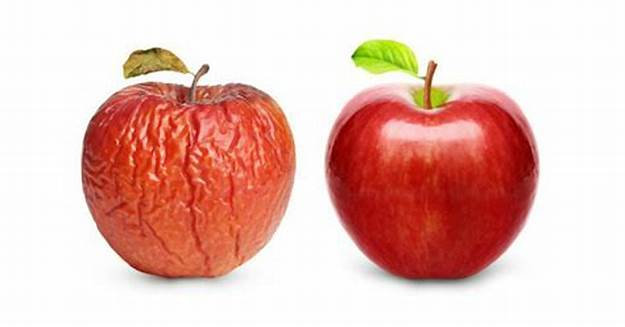

## 1. Tujuan dan Batasan Masalah

**Tujuan** : Memprediksi kualitas setiap apel dengan mengklasifikasikannya sebagai 'good' atau 'bad'.

**Batasan masalah** : Data yang digunakan untuk melatih model hanya mencakup beberapa fitur yang dapat mempengaruhi kualitas apel, seperti ukuran, massa, rasa manis, tekstur, kelembapan atau kadar jus, kematangan, dan rasa asam.

**Kriteria keberhasilan** : Accuracy model hasil prediksi di atas 90%.

## 2. Sumber Data

Berikut adalah sumber untuk masing-masing data (dalam Kaggle):
1. `train set`         : https://www.kaggle.com/competitions/dsc-2024-temporary/data?select=train.csv
2. `test set`          : https://www.kaggle.com/competitions/dsc-2024-temporary/data?select=test.csv

## 3. Importing Libraries

In [ ]:
# Data Science and Visualization Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Profiling Libraries
!pip install ydata-profiling
from ydata_profiling import ProfileReport

# Scikit-Learn Libraries
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Evaluation Metric Libraries
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score, precision_score, f1_score, recall_score

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 22.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=af6076edd9462e29befd76419abf76a0970b7fceecebbc8ada4912a48af0a559
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 4. Load Data dan Eksplorasi/EDA (Sebelum Praproses)

### 4.1 Isi Sampel Dataset (Data Pelatihan)

In [ ]:
#Load dataset
traindata = pd.read_csv("/content/drive/MyDrive/DSC 2024 - SCC HIMASTA ITS/Project/train.csv")
traindata.head(10)

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0,-0.155024,-1.901167,2.615144,1.091245,1.642629,0.378677,-1.705312,good
1,1,-2.730624,-1.808060,-4.085386,0.172564,-1.579260,3.380989,-3.847081,bad
2,2,-0.599057,2.046434,-2.877662,0.505389,0.228996,1.890559,2.211756,bad
3,3,-2.010945,-1.426566,-2.334610,1.302376,0.142687,3.922959,0.017695,bad
4,4,-1.977980,-0.229483,1.283458,0.238898,1.049935,0.682324,0.369580,good
5,5,-0.157161,-0.860920,-1.478031,2.071683,2.945618,-2.891162,-0.387312,good
6,6,-1.275379,-2.951184,-0.478870,-0.479450,2.528808,-0.433067,4.280580,bad
7,7,-1.231758,1.363141,-5.746674,2.787437,-0.703580,1.627143,0.105004,bad
8,8,2.741078,-2.681437,-1.571582,1.284662,1.543036,-0.063482,0.387883,good
9,9,1.473626,-0.395561,-3.009929,-0.329945,2.118434,0.664161,1.139624,good


### 4.2 Informasi Dataset

In [ ]:
#Data Information
traindata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         2800 non-null   int64  
 1   Size         2800 non-null   float64
 2   Weight       2800 non-null   float64
 3   Sweetness    2800 non-null   float64
 4   Crunchiness  2800 non-null   float64
 5   Juiciness    2800 non-null   float64
 6   Ripeness     2800 non-null   float64
 7   Acidity      2800 non-null   float64
 8   Quality      2800 non-null   object 
dtypes: float64(7), int64(1), object(1)
memory usage: 197.0+ KB


In [ ]:
traindata.shape

(2800, 9)

### 4.3 Rangkuman Statistik Dataset

In [ ]:
# Summary of Data
traindata.describe()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity
count,2800.000000,2800.000000,2800.000000,2800.000000,2800.000000,2800.000000,2800.000000,2800.000000
mean,1399.500000,-0.514743,-0.995706,-0.431350,1.001451,0.511097,0.481112,0.108868
std,808.434702,1.930621,1.609845,1.970578,1.399908,1.934171,1.856247,2.093538
min,0.000000,-7.151703,-7.149848,-6.894485,-6.055058,-5.961897,-5.864599,-6.739693
25%,699.750000,-1.850394,-2.020728,-1.741682,0.092788,-0.789481,-0.765048,-1.337362
50%,1399.500000,-0.514732,-0.988641,-0.498620,1.030332,0.517691,0.491046,0.041436
75%,2099.250000,0.820971,0.035267,0.846253,1.902271,1.843950,1.718011,1.562816
max,2799.000000,6.406367,5.790714,6.374916,7.561485,7.364403,5.917886,7.404736


In [ ]:
# Duplicate Data
duplikat = traindata.duplicated().sum()
print("Jumlah baris yang memiliki data sama: {} baris".format(duplikat))

Jumlah baris yang memiliki data sama: 0 baris


### 4.4 Profile Report Dataset

In [ ]:
#Profile Report
from ydata_profiling import ProfileReport

profile = ProfileReport(traindata,title = 'Apple Quality')
profile.to_notebook_iframe()
profile.to_file("books_traindata1.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 4.5 Visualisasi Proporsi Variabel Target (Untuk Klasifikasi)

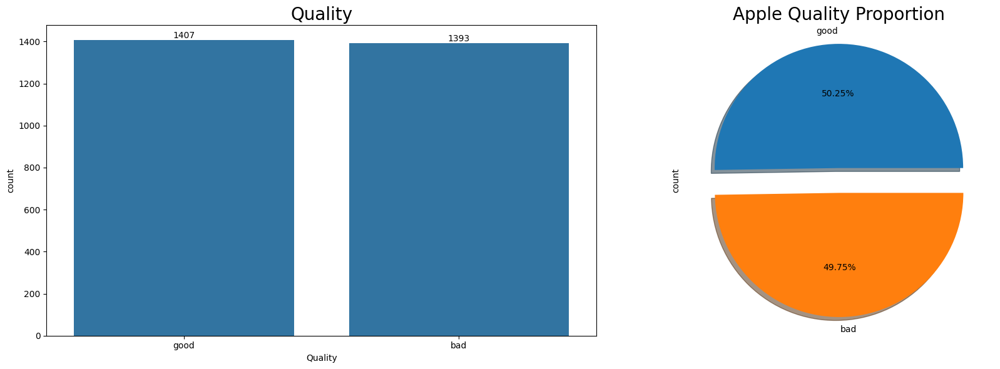

In [ ]:
#Visualization of Target Variable Proportions

# Set the figure size
plt.figure(figsize=(18, 6))

# First Subplot
Left_Shape = plt.subplot(1, 2, 1)
sns.countplot(x="Quality", data=traindata)
Left_Shape.bar_label(Left_Shape.containers[0])
Left_Shape.set_title("Quality", fontsize=20)

# Second Subplot
Right_Shape = plt.subplot(1, 2, 2)
traindata["Quality"].value_counts().plot.pie(explode=[0.1, 0.1], autopct="%1.2f%%", shadow=True)
Right_Shape.set_title(label="Apple Quality Proportion", fontsize=20)

plt.tight_layout()
plt.show()

### 4.6 Visualisasi Outlier Seluruh Variabel Non Object


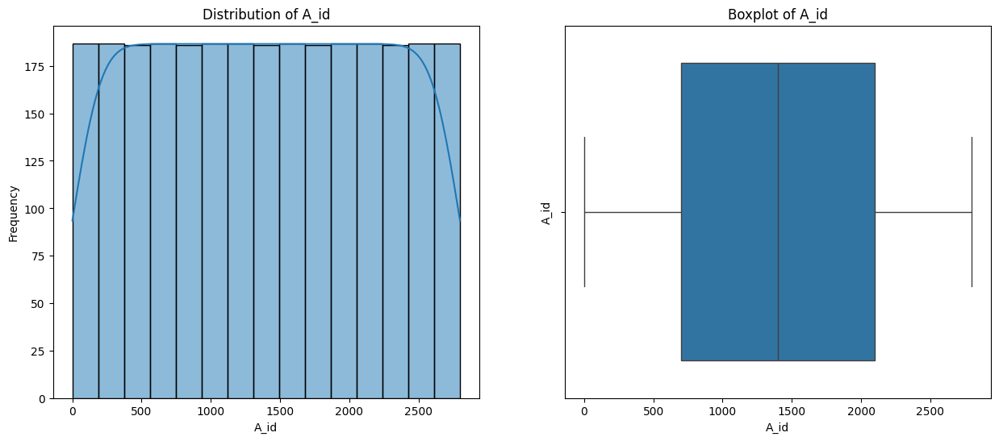

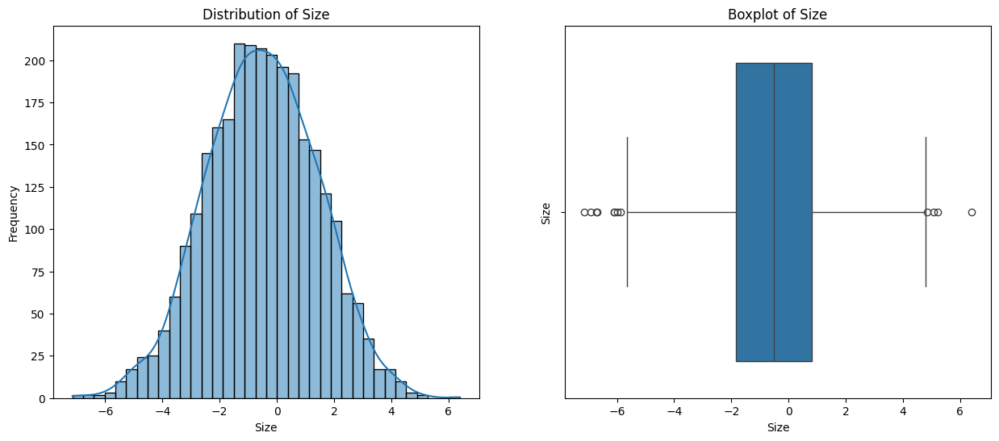

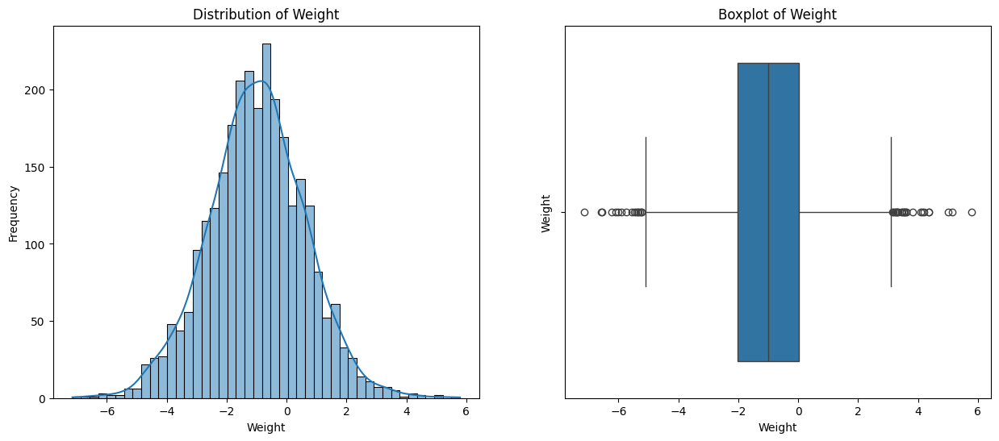

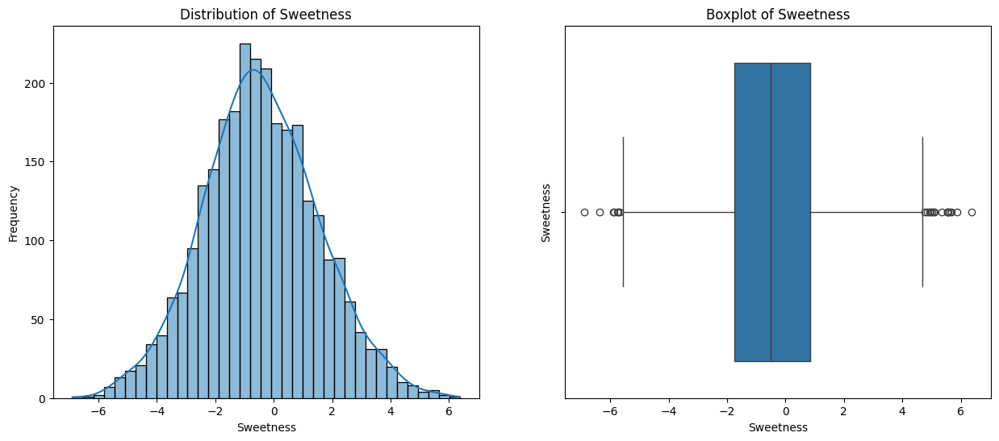

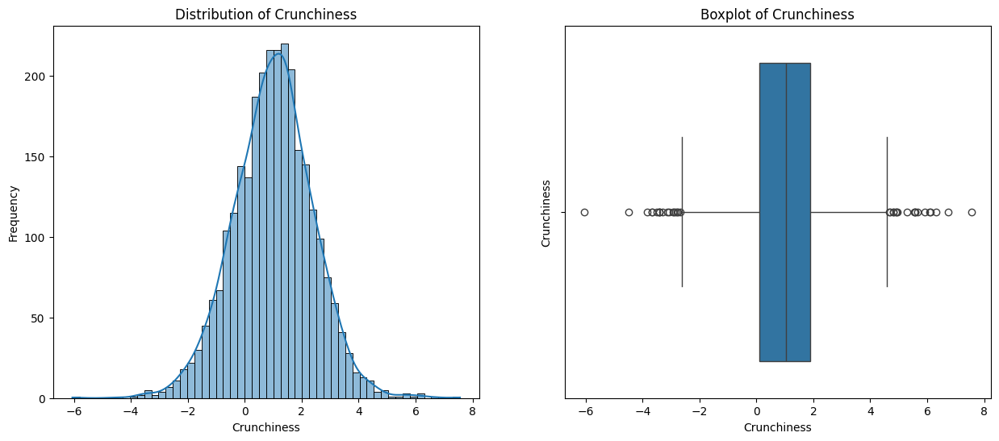

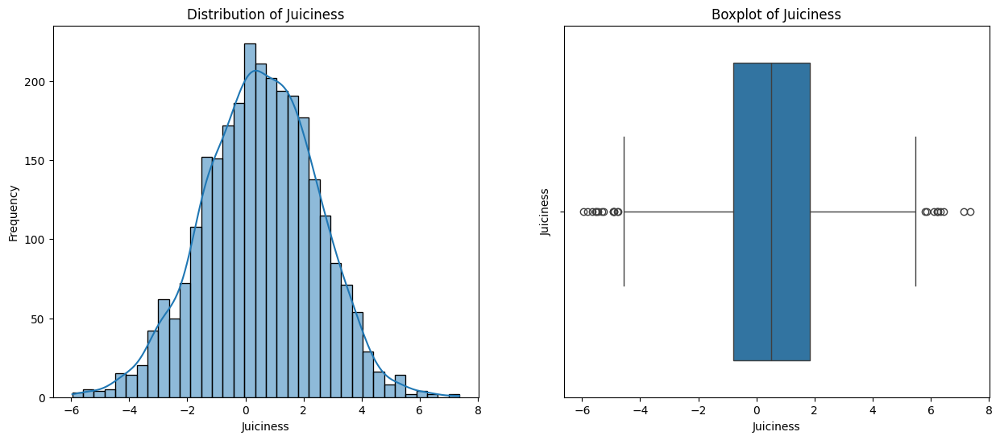

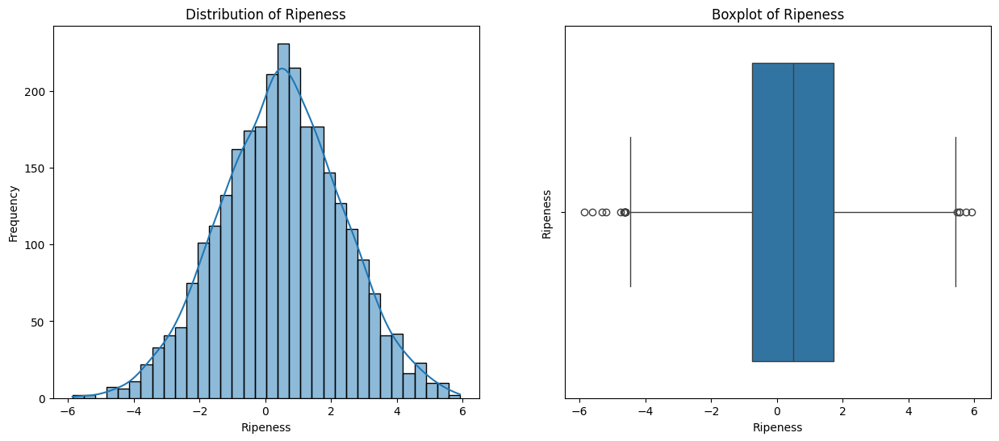

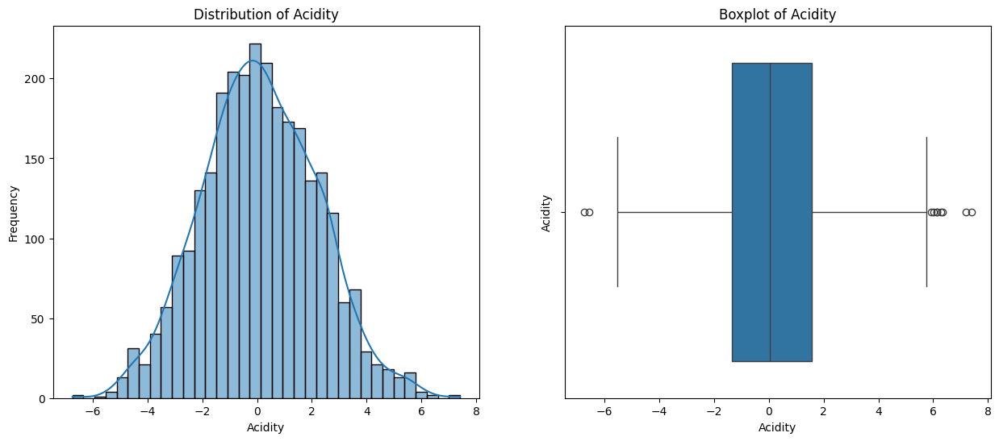

In [ ]:
#Outlier Visualization

# Loop through each column
for column in traindata.columns:
    if traindata[column].dtype != "object":
        plt.figure(figsize=(15, 6))

        # Distribution plot
        plt.subplot(1, 2, 1)
        sns.histplot(data=traindata, x=column, kde=True)
        plt.ylabel("Frequency")
        plt.xlabel(column)
        plt.title(f"Distribution of {column}")

        # Boxplot
        plt.subplot(1, 2, 2)
        sns.boxplot(data=traindata, x=column)
        plt.ylabel(column)
        plt.title(f"Boxplot of {column}")

        # Show the plots
        plt.show()


### 4.7 Tabel Jumlah Outlier per Variabel

In [ ]:
# Count outliers using IQR for each column
def count_outliers_iqr(dataframe):
    outlier_counts = {}

    for column in dataframe.columns:
      if dataframe[column].dtype != "object":
        Q1 = dataframe[column].quantile(0.25)
        Q3 = dataframe[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Count outliers
        outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]
        outlier_counts[column] = len(outliers)

    return outlier_counts

outlier_counts = count_outliers_iqr(traindata)

# Convert the outlier counts dictionary to a DataFrame
outlier_counts_traindata = pd.DataFrame(list(outlier_counts.items()), columns=['Column', 'Outlier Count'])

# Display the DataFrame
outlier_counts_traindata

,Column,Outlier Count
0,A_id,0
1,Size,12
2,Weight,39
3,Sweetness,22
4,Crunchiness,36
5,Juiciness,24
6,Ripeness,16
7,Acidity,10


### 4.8 Interpretasi Hasil

* Dataset ini terdiri dari 2.800 record data yang mencakup sembilan variabel, termasuk satu variabel ID, tujuh variabel fitur (Size, Weight, Sweetness, Crunchiness, Juiciness, Ripeness, dan Acidity), serta satu variabel target (Quality).

* Dataset ini sudah bersih, tanpa nilai yang hilang atau data duplikat. Sehingga tidak memerlukan pemrosesan lebih lanjut untuk dua hal ini.

* Nilai dari variabel fitur berkisar antara positif dan negatif, yang dalam konteks dunia nyata mungkin tidak masuk akal, seperti nilai negatif pada ukuran atau berat. Namun, kemungkinan besar nilai negatif ini muncul karena transformasi data sebelumnya, seperti standarisasi yang mengubah fitur menjadi z-score, atau penggunaan skala relatif di mana nilai negatif menunjukkan pengukuran di bawah baseline.

* Analisis korelasi menunjukkan tidak adanya korelasi tinggi antara variabel fitur, sehingga semua variabel fitur akan digunakan dalam pembangunan model.

* Variabel target yang menggambarkan kualitas buah terbagi secara seimbang, dengan 50,25% data apel dikategorikan sebagai berkualitas baik dan 49,75% sebagai berkualitas buruk, sehingga tidak diperlukan penyeimbangan data lebih lanjut.

* Terdapat beberapa outlier pada variabel tertentu seperti Weight, Crunchiness, Juiciness, dan Sweetness, dengan masing-masing lebih dari 20 outlier, serta variabel lain yang memiliki lebih dari 10 outlier. Dampak outlier ini terhadap kinerja model akan dievaluasi dengan melatih model menggunakan dataset asli dan dataset yang telah dihilangkan outliernya, untuk menentukan strategi yang paling efektif.


## 5. Praproses

### 5.1 Label Encoding

In [ ]:
#Label Encoding - Quality
label_encoder = LabelEncoder()
traindata["Quality"] = label_encoder.fit_transform(traindata["Quality"])

### 5.2 Handling Data Outlier

In [ ]:
# Remove outliers using IQR for each column
def remove_outliers_iqr(dataframe):
    dataframe_filtered = dataframe.copy()
    for column in dataframe.columns:
        Q1 = dataframe[column].quantile(0.25)
        Q3 = dataframe[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        dataframe_filtered = dataframe_filtered[(dataframe_filtered[column] >= lower_bound) & (dataframe_filtered[column] <= upper_bound)]
    return dataframe_filtered

traindata_filtered = remove_outliers_iqr(traindata)

### 5.3 Interpretasi Hasil

* Proses Label Encoding ditujukan untuk mengubah variabel target yang bersifat kategori (seperti "baik" dan "buruk") menjadi bentuk numerik (1, 0). Ini penting karena model machine learning umumnya memerlukan input dalam format angka untuk dapat melakukan perhitungan dan analisis. Dengan melakukan label encoding, kita dapat memudahkan pemrosesan data dan meningkatkan kompatibilitas dengan algoritma yang akan digunakan nantinya.

* Dengan menggunakan metode Interquartile Range (IQR), proses penghapusan outlier ini melibatkan perhitungan kuartil pertama (Q1) dan kuartil ketiga (Q3) untuk setiap kolom, lalu menentukan batas bawah dan batas atas untuk mendeteksi nilai yang berada di luar rentang ini.


## 6. Load Data dan Eksplorasi/EDA (Setelah Praproses)



### 6.1 Informasi Dataset

In [ ]:
#Data Information
traindata_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2653 entries, 0 to 2799
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         2653 non-null   int64  
 1   Size         2653 non-null   float64
 2   Weight       2653 non-null   float64
 3   Sweetness    2653 non-null   float64
 4   Crunchiness  2653 non-null   float64
 5   Juiciness    2653 non-null   float64
 6   Ripeness     2653 non-null   float64
 7   Acidity      2653 non-null   float64
 8   Quality      2653 non-null   int64  
dtypes: float64(7), int64(2)
memory usage: 207.3 KB


In [ ]:
traindata_filtered.shape

(2653, 9)

### 6.2 Rangkuman Statistik Dataset

In [ ]:
# Summary of Data
traindata_filtered.describe()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
count,2653.000000,2653.000000,2653.000000,2653.000000,2653.000000,2653.000000,2653.000000,2653.000000,2653.000000
mean,1400.714663,-0.510518,-0.999159,-0.451059,0.996603,0.497556,0.528129,0.092417,0.491142
std,808.195401,1.868902,1.501259,1.895799,1.290363,1.850413,1.790270,2.048880,0.500016
min,0.000000,-5.648196,-5.058679,-5.571881,-2.620954,-4.563025,-4.471210,-5.537819,0.000000
25%,701.000000,-1.812728,-1.990630,-1.743975,0.125125,-0.778969,-0.690392,-1.333122,0.000000
50%,1396.000000,-0.514302,-0.988645,-0.501592,1.020848,0.502035,0.525590,0.026873,0.000000
75%,2104.000000,0.783393,0.010543,0.824485,1.870798,1.799345,1.741950,1.525040,1.000000
max,2799.000000,4.799683,3.081538,4.666591,4.579679,5.464513,5.411911,5.746699,1.000000


In [ ]:
# Duplicate Data
duplikat = traindata_filtered.duplicated().sum()
print("Jumlah baris yang memiliki data sama: {} baris".format(duplikat))

Jumlah baris yang memiliki data sama: 0 baris


### 6.3 Profile Report Dataset

In [ ]:
#Profile Report
from ydata_profiling import ProfileReport

profile = ProfileReport(traindata_filtered,title = 'Apple Quality - Filtered Train Data')
profile.to_notebook_iframe()
profile.to_file("books_traindata2.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 6.4 Visualisasi Proporsi Variabel Target (Untuk Klasifikasi)

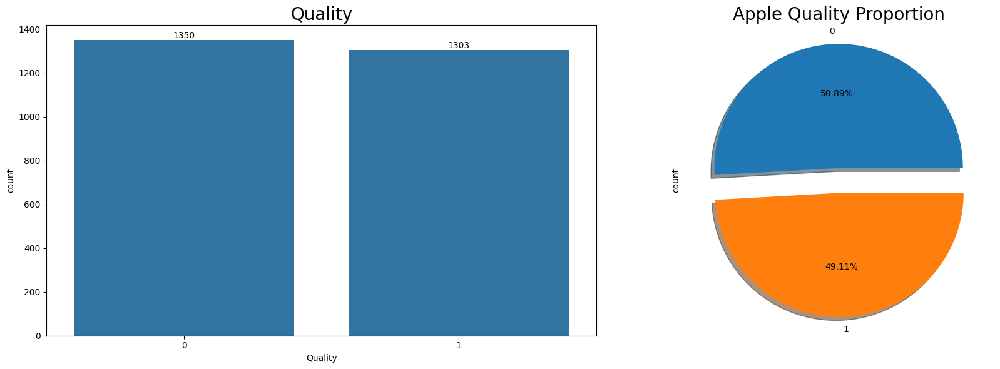

In [ ]:
#Visualization of Target Variable Proportions

# Set the figure size
plt.figure(figsize=(18, 6))

# First Subplot
Left_Shape = plt.subplot(1, 2, 1)
sns.countplot(x="Quality", data=traindata_filtered)
Left_Shape.bar_label(Left_Shape.containers[0])
Left_Shape.set_title("Quality", fontsize=20)

# Second Subplot
Right_Shape = plt.subplot(1, 2, 2)
traindata_filtered["Quality"].value_counts().plot.pie(explode=[0.1, 0.1], autopct="%1.2f%%", shadow=True)
Right_Shape.set_title(label="Apple Quality Proportion", fontsize=20)

plt.tight_layout()
plt.show()

### 6.5 Visualisasi Outlier Seluruh Variabel Non Object

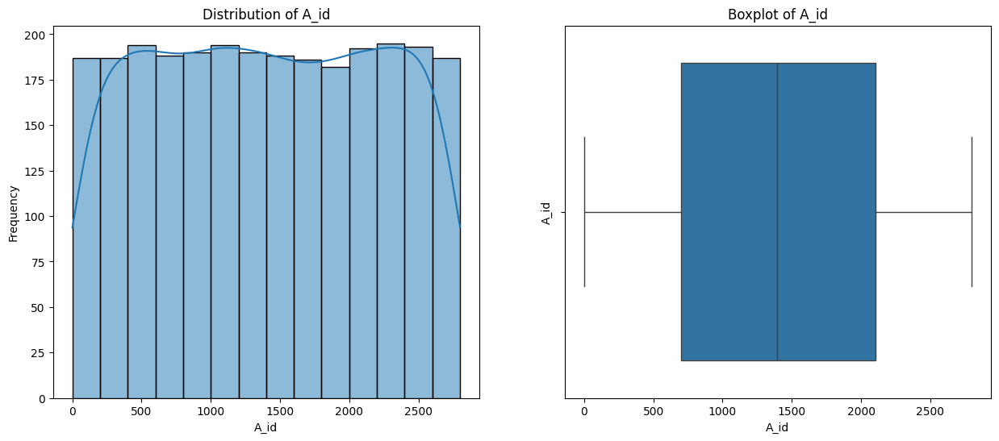

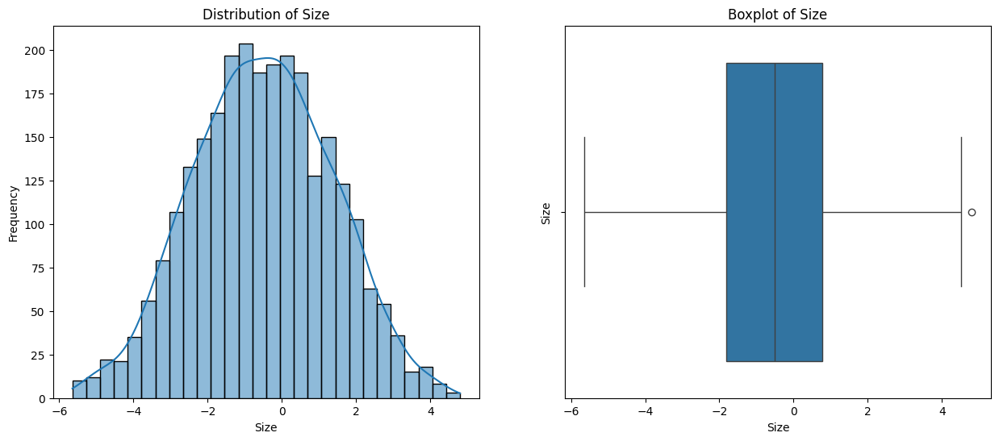

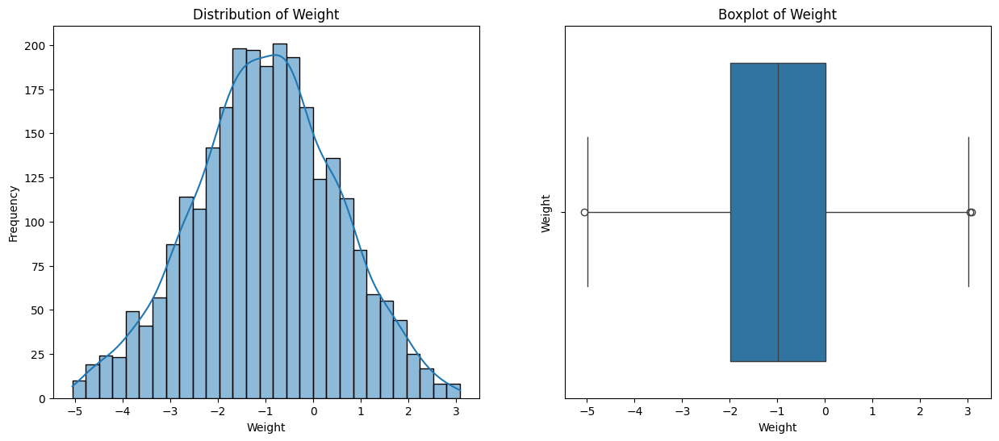

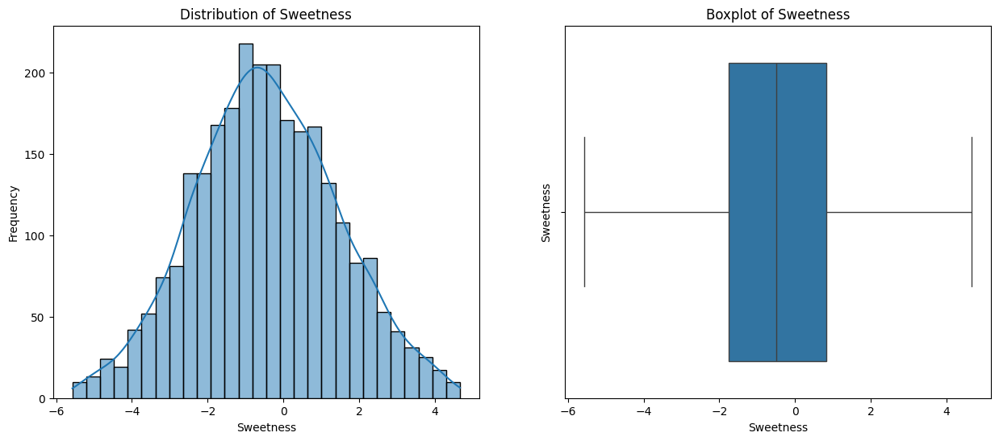

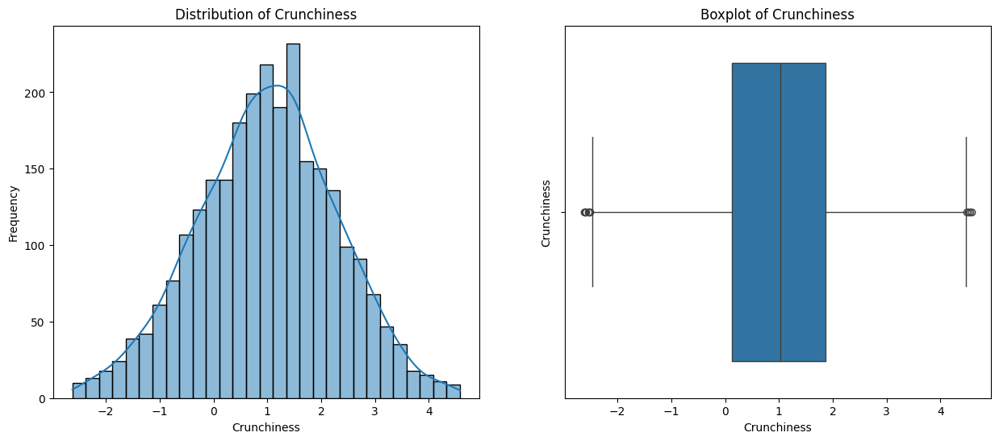

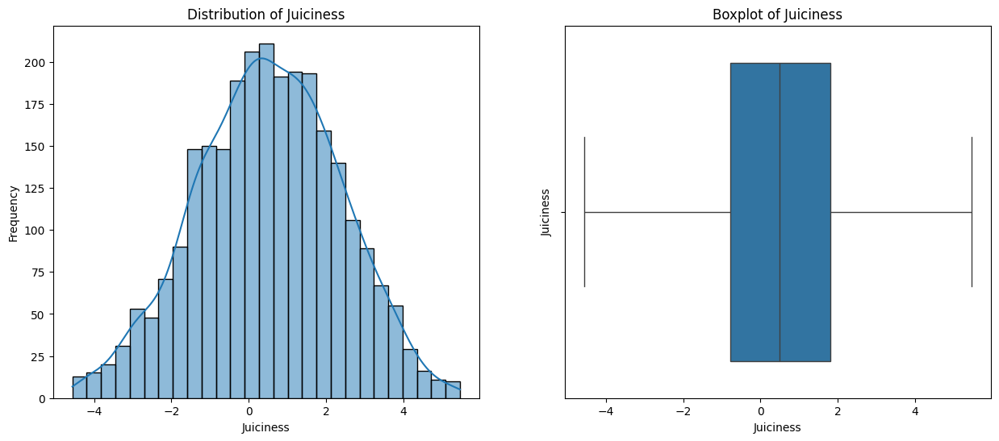

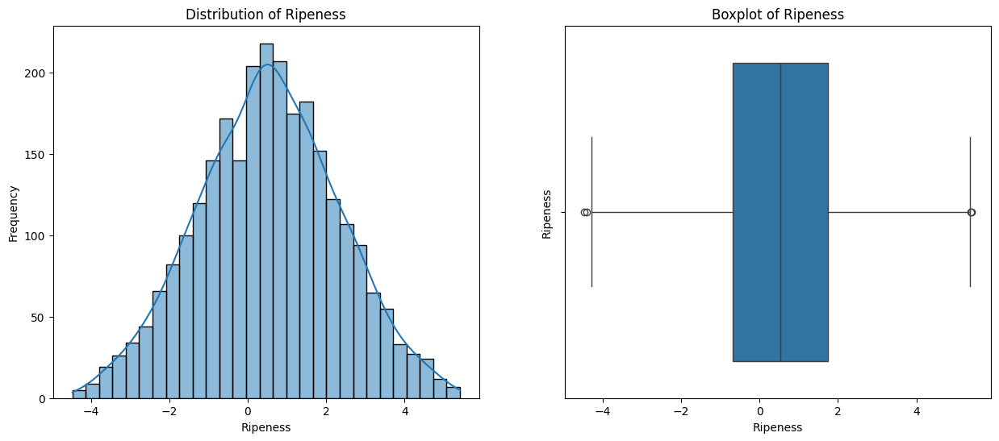

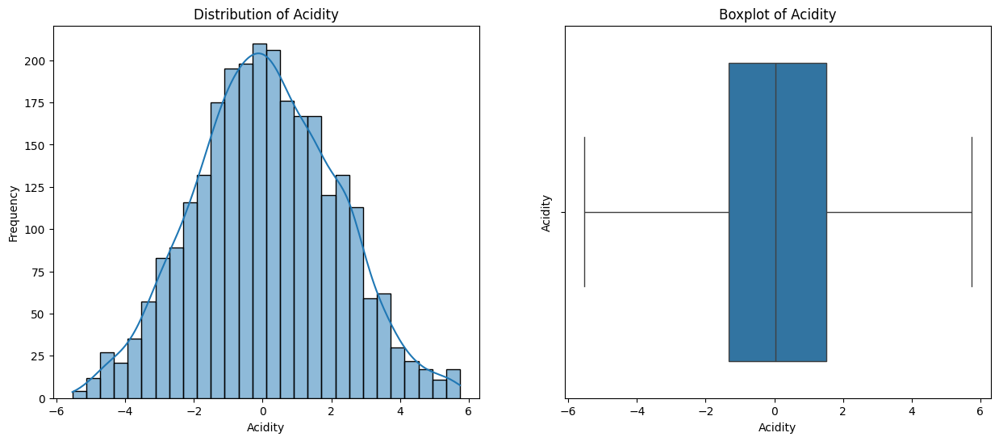

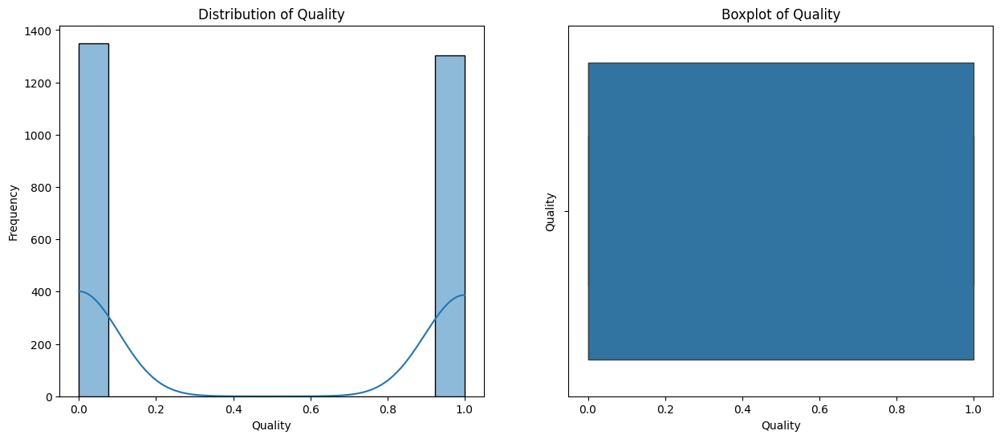

In [ ]:
#Outlier Visualization

# Loop through each column
for column in traindata_filtered.columns:
    if traindata_filtered[column].dtype != "object":
        plt.figure(figsize=(15, 6))

        # Distribution plot
        plt.subplot(1, 2, 1)
        sns.histplot(data=traindata_filtered, x=column, kde=True)
        plt.ylabel("Frequency")
        plt.xlabel(column)
        plt.title(f"Distribution of {column}")

        # Boxplot
        plt.subplot(1, 2, 2)
        sns.boxplot(data=traindata_filtered, x=column)
        plt.ylabel(column)
        plt.title(f"Boxplot of {column}")

        # Show the plots
        plt.show()


### 6.6 Tabel Perbandingan Outlier Setelah dan Sebelum Praproses

In [ ]:
# Count outliers using IQR for each column
def count_outliers_iqr(dataframe):
    outlier_counts = {}

    for column in dataframe.columns:
      if dataframe[column].dtype != "object":
        Q1 = dataframe[column].quantile(0.25)
        Q3 = dataframe[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Count outliers
        outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]
        outlier_counts[column] = len(outliers)

    return outlier_counts

outlier_counts = count_outliers_iqr(traindata_filtered)

# Convert the outlier counts dictionary to a DataFrame
outlier_counts_traindata_filtered = pd.DataFrame(list(outlier_counts.items()), columns=['Column', 'Outlier Count'])

# Merge the two DataFrames for comparison (before and after preprocessing)
comparison_outlier = pd.merge(outlier_counts_traindata, outlier_counts_traindata_filtered, on='Column')
comparison_outlier.columns = ['Column', 'Outliers Before Preprocessing', 'Outliers After Preprocessing']

# Display the comparison DataFrame
comparison_outlier

,Column,Outliers Before Preprocessing,Outliers After Preprocessing
0,A_id,0,0
1,Size,12,1
2,Weight,39,3
3,Sweetness,22,0
4,Crunchiness,36,10
5,Juiciness,24,0
6,Ripeness,16,4
7,Acidity,10,0


### 6.7 Interpretasi Hasil

* Setelah dilakukan praproses, dataset yang awalnya memiliki 2.800 record kini berkurang menjadi 2.653 record akibat penghapusan outlier.

* Proses praproses juga berdampak pada distribusi variabel target; pada dataset asli, 50,25% dari data apel dikategorikan sebagai berkualitas baik dan 49,75% sebagai berkualitas buruk. Namun, setelah praproses, proporsi ini berubah menjadi 49,11% untuk apel berkualitas baik dan 50,89% untuk apel berkualitas buruk, menunjukkan sedikit pergeseran tetapi tetap mempertahankan keseimbangan yang cukup baik antara kedua kelas.

* Proses praproses berhasil mengurangi jumlah outlier secara signifikan. Tiga dari tujuh variabel fitur tidak memiliki outlier sama sekali, yang menunjukkan bahwa fitur-fitur tersebut kini lebih konsisten dan dapat diandalkan. Sementara itu, empat variabel lainnya hanya menyisakan sedikit outlier, masing-masing memiliki 1, 3, 4, atau 10 outlier saja.

## 7. Persiapan Pembuatan Model

### 7.1 Deklarasi Variabel Fitur dan Variabel Target

In [ ]:
# X Data
X = traindata_filtered.drop(["A_id","Quality"], axis=1)
print("X shape is : ", X.shape)

# y Data
y = traindata_filtered["Quality"]
print("y shape is : ", y.shape)

X shape is :  (2653, 7)
y shape is :  (2653,)


### 7.2 Pembagian Data Pelatihan dan Data Validasi

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

# Splitted Data
print("X_train shape is ", X_train.shape)
print("X_val shape is ", X_val.shape)
print("y_train shape is ", y_train.shape)
print("y_val shape is ", y_val.shape)

X_train shape is  (2122, 7)
X_val shape is  (531, 7)
y_train shape is  (2122,)
y_val shape is  (531,)


### 7.3 Interpretasi Hasil

* Setelah melakukan praproses pada dataset, data fitur (X) dan label target (y) dipisahkan untuk keperluan pelatihan model. Data fitur X diperoleh dengan menghapus kolom A_id dan Quality, sehingga ukuran X menjadi (2.653, 7), yang menunjukkan bahwa terdapat 2.653 record dan 7 variabel fitur yang tersisa. Sementara itu, variabel target y, yang merupakan kolom Quality, memiliki ukuran (2.653,), mencerminkan jumlah yang sama dengan data fitur.

* Data dibagi menjadi dua bagian: data pelatihan dan data validasi, menggunakan fungsi train_test_split dengan proporsi 80:20. Setelah pembagian, ukuran X_train menjadi (2.122, 7) dan y_train menjadi (2.122,), yang menunjukkan bahwa 2.122 record digunakan untuk pelatihan model. Sebaliknya, ukuran X_val menjadi (531, 7) dan y_val menjadi (531,), yang mencerminkan 531 record digunakan untuk validasi model. Pembagian ini bertujuan untuk memastikan bahwa model yang dilatih dapat diuji/validasi dengan data yang belum pernah dilihat sebelumnya, sehingga dapat dievaluasi seberapa baik model tersebut dalam menggeneralisasi ke data baru.

## 8. Pembangunan dan Evaluasi Model

### 8.1 Pembangunan 10 Model Umum dan Evaluasi


Logistic Regression
Cross-Validation Accuracy: 0.7488 (+/- 0.0271)
Accuracy on Validation Set: 0.7156
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.72      0.70       246
           1       0.75      0.71      0.73       285

    accuracy                           0.72       531
   macro avg       0.71      0.72      0.71       531
weighted avg       0.72      0.72      0.72       531


Linear Discriminant
Cross-Validation Accuracy: 0.7521 (+/- 0.0273)
Accuracy on Validation Set: 0.7213
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.72      0.70       246
           1       0.75      0.73      0.74       285

    accuracy                           0.72       531
   macro avg       0.72      0.72      0.72       531
weighted avg       0.72      0.72      0.72       531


Quadratic Discriminant
Cross-Validation Accuracy: 0.8478 (+/- 0.0234)
Accuracy on Validation 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptro

Cross-Validation Accuracy: 0.9109 (+/- 0.0151)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Accuracy on Validation Set: 0.8964
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.87      0.89       246
           1       0.89      0.92      0.90       285

    accuracy                           0.90       531
   macro avg       0.90      0.89      0.90       531
weighted avg       0.90      0.90      0.90       531


Gradient Boosting
Cross-Validation Accuracy: 0.8506 (+/- 0.0214)
Accuracy on Validation Set: 0.8267
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.79      0.81       246
           1       0.82      0.86      0.84       285

    accuracy                           0.83       531
   macro avg       0.83      0.82      0.83       531
weighted avg       0.83      0.83      0.83       531


Comparison of Classifier Accuracies:
               Classifier  Cross-Validation Accuracy  Validation Set Accuracy
0     Logistic Regression                   0.74

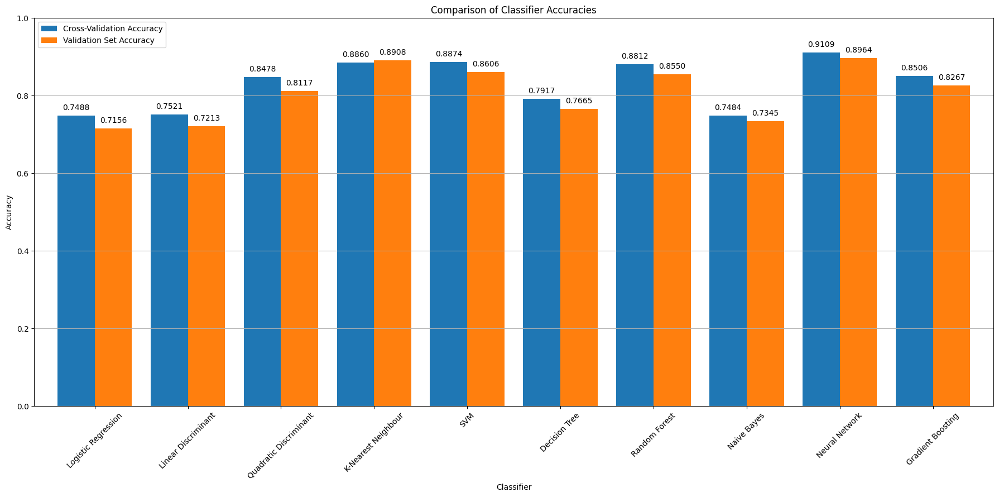

In [ ]:
# List of classifiers to try
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Linear Discriminant': LinearDiscriminantAnalysis(),
    'Quadratic Discriminant': QuadraticDiscriminantAnalysis(),
    'K-Nearest Neighbour': KNeighborsClassifier(),
    'SVM': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Naive Bayes': GaussianNB(),
    'Neural Network': MLPClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
}

# Lists to store accuracies
cv_accuracies = []
val_accuracies = []

# Number of folds for cross-validation
k = 10
skf = StratifiedKFold(n_splits=k)

# Train and evaluate each classifier using k-fold cross-validation
for name, clf in classifiers.items():
    print(f"\n{50*'='}\n{name}\n{50*'='}")
    cv_scores = cross_val_score(clf, X_train, y_train, cv=k, scoring='accuracy')
    cv_accuracies.append(cv_scores.mean())
    print(f"Cross-Validation Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")

    # Fit the classifier on the whole training data
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val)
    val_accuracy = accuracy_score(y_val, y_pred)
    val_accuracies.append(val_accuracy)
    print(f"Accuracy on Validation Set: {val_accuracy:.4f}")
    print("Classification Report:")
    print(classification_report(y_val, y_pred))

# Create a DataFrame to store the results
comparison_model = pd.DataFrame({
    'Classifier': list(classifiers.keys()),
    'Cross-Validation Accuracy': cv_accuracies,
    'Validation Set Accuracy': val_accuracies
})

# Print the DataFrame
print("\nComparison of Classifier Accuracies:")
print(comparison_model)

# Plot the comparison
comparison_model.set_index('Classifier', inplace=True)
ax = comparison_model.plot(kind='bar', figsize=(18, 9), width=0.8)
plt.title('Comparison of Classifier Accuracies')
plt.ylabel('Accuracy')
plt.xlabel('Classifier')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend(loc='upper left')

# Add annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.tight_layout()
plt.show()

### 8.2 Pembangunan Model Terbaik (Multilayer Perceptron/ Neural Network) dengan Hyperparameter Tuning dan Evaluasi

In [ ]:
# MLP - Hyperparameter Tuning

# Create a MLPClassifier
mlp = MLPClassifier(random_state=42, max_iter=300)

# Define the parameter grid for tuning
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50), (150, 100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
    'learning_rate_init': [0.001, 0.01, 0.1]
}

# Create a GridSearchCV object with the defined parameter grid
grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Score: {best_score:.4f}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_pred)

print(f"Validation Set Accuracy of Best Model: {val_accuracy:.4f}")
print("Classification Report:")
print(classification_report(y_val, y_pred))

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'solver': 'adam'}
Best Cross-Validation Score: 0.9364
Validation Set Accuracy of Best Model: 0.9416
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       246
           1       0.94      0.95      0.95       285

    accuracy                           0.94       531
   macro avg       0.94      0.94      0.94       531
weighted avg       0.94      0.94      0.94       531



### 8.3 Model Terbaik (Multilayer Perceptron/ Neural Network) dengan Data Tanpa Outlier

Accuracy: 94.16%
Precision: 93.79%
Recall: 95.44%
F1 Score: 94.61%


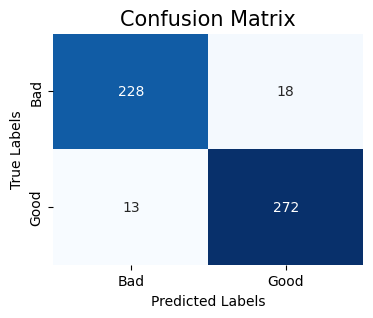

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       246
           1       0.94      0.95      0.95       285

    accuracy                           0.94       531
   macro avg       0.94      0.94      0.94       531
weighted avg       0.94      0.94      0.94       531



In [ ]:
# Initialize the model
nn_model = MLPClassifier(random_state=42, max_iter=300, activation='relu',alpha=0.0001, hidden_layer_sizes=(100,),
                         learning_rate='constant', learning_rate_init=0.01, solver='adam')

# Fit the model on the training data
nn_model.fit(X_train, y_train)

# Use the model to predict on the validation data
y_pred = nn_model.predict(X_val)

# Evaluate the model using classification metrics
accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'Precision: {precision * 100:.2f}%')
print(f'Recall: {recall * 100:.2f}%')
print(f'F1 Score: {f1 * 100:.2f}%')

# Confusion Matrix
cm = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(4, 3))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False,
            xticklabels=['Bad', 'Good'], yticklabels=['Bad', 'Good'])
plt.title('Confusion Matrix', fontsize=15)
plt.xlabel('Predicted Labels', fontsize=10)
plt.ylabel('True Labels', fontsize=10)
plt.show()

# Classification Report
class_report = classification_report(y_val, y_pred)
print('Classification Report:')
print(class_report)

### 8.4 Model Terbaik (Multilayer Perceptron/ Neural Network) dengan Keseluruhan Data (Tanpa Penanganan Outlier)

In [ ]:
# X Data
X = traindata.drop(["A_id","Quality"], axis=1)
print("X shape is : ", X.shape)

# y Data
y = traindata["Quality"]
print("y shape is : ", y.shape)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

X shape is :  (2800, 7)
y shape is :  (2800,)


Accuracy: 95.00%
Precision: 95.10%
Recall: 95.10%
F1 Score: 95.10%


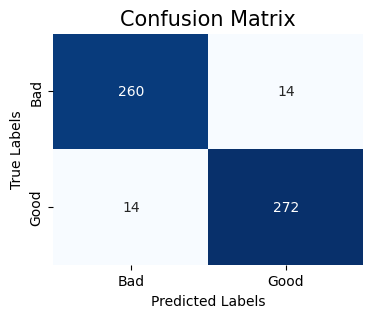

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       274
           1       0.95      0.95      0.95       286

    accuracy                           0.95       560
   macro avg       0.95      0.95      0.95       560
weighted avg       0.95      0.95      0.95       560



In [ ]:
# Initialize the model
nn_model = MLPClassifier(random_state=42, max_iter=300, activation='relu',alpha=0.0001, hidden_layer_sizes=(100,),
                         learning_rate='constant', learning_rate_init=0.01, solver='adam')

# Fit the model on the training data
nn_model.fit(X_train, y_train)

# Use the model to predict on the validation data
y_pred = nn_model.predict(X_val)

# Evaluate the model using classification metrics
accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)

print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'Precision: {precision * 100:.2f}%')
print(f'Recall: {recall * 100:.2f}%')
print(f'F1 Score: {f1 * 100:.2f}%')

# Confusion Matrix
cm = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(4, 3))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False,
            xticklabels=['Bad', 'Good'], yticklabels=['Bad', 'Good'])
plt.title('Confusion Matrix', fontsize=15)
plt.xlabel('Predicted Labels', fontsize=10)
plt.ylabel('True Labels', fontsize=10)
plt.show()

# Classification Report
class_report = classification_report(y_val, y_pred)
print('Classification Report:')
print(class_report)

### 8.5 Interpretasi Hasil

* Pembangunan dan evaluasi sepuluh model klasifikasi menunjukkan variasi kinerja yang signifikan di antara metode yang diuji.

* Logistic Regression, Naive Bayes, dan Linear Discriminant Analysis memiliki akurasi cross-validation yang paling rendah, masing-masing 74,88%, 74,84%,dan 75,21% dengan akurasi pada set validasi juga di bawah 74%, menunjukkan keterbatasan dalam kemampuan model ini untuk menangkap kompleksitas data.

* Decision Tree menunjukkan hasil yang lebih baik dengan akurasi 79,17% pada cross-validation dan 76,65% pada set validasi. Meskipun lebih baik dari model sebelumnya, hasil ini masih menunjukkan potensi yang terbatas.

* Quadratic Discriminant Analysis mencatat peningkatan kinerja yang substansial dengan akurasi 84,78% dan 81,17%, menunjukkan bahwa model ini dapat menangkap pola yang lebih kompleks dalam data.

* K-Nearest Neighbour (KNN) dan SVM menghasilkan akurasi yang cukup tinggi, masing-masing 88,60% dan 88,74% pada cross-validation, dengan akurasi validasi mencapai 89,08% dan 86,06%. Ini menunjukkan bahwa model berbasis jarak ini efektif dalam pengenalan pola.

* Random Forest memberikan hasil yang baik dengan akurasi 88,12% dan 85,50%, menunjukkan kemampuan agregasi model pohon keputusan untuk meningkatkan akurasi klasifikasi.

* Neural Network adalah model yang paling unggul dengan akurasi cross-validation tertinggi 91,09% dan akurasi validasi 89,64%. Meskipun peringatan konvergensi muncul, model ini menunjukkan potensi yang sangat baik dalam mengklasifikasikan data dengan akurasi yang solid di kedua metrik.

* Gradient Boosting juga menunjukkan hasil yang baik dengan akurasi 85,06% pada cross-validation dan 82,67% pada set validasi, namun tidak sebaik model Neural Network.

* Model Neural Network (MLP) dipilih sebagai model dengan performa terbaik dan dilakukan hyperparameter tuning.

* Pembangunan model Multilayer Perceptron (Neural Network) dengan hyperparameter tuning menunjukkan hasil yang sangat memuaskan.

* Parameter terbaik untuk model Multilayer Perceptron (MLP) yang digunakan dalam pembangunan model ini adalah sebagai berikut:
  1. Activation: 'relu'
  2. Alpha: 0.0001
  3. Hidden Layer Sizes: (100,)
  4. Learning Rate: 'constant'
  5. Learning Rate Init: 0.01
  6. Solver: 'adam'

* Parameter tersebut menunjukkan konfigurasi optimal yang dicapai melalui hyperparameter tuning untuk meningkatkan kinerja model dalam klasifikasi. Model dengan parameter ini berhasil mencapai skor cross-validation tertinggi sebesar 93,64% dan akurasi pada set validasi mencapai 94,16%. Kinerja model ini terlihat dalam laporan klasifikasi, di mana precision, recall, dan f1-score masing-masing mencapai 0,94 untuk kedua kelas, menunjukkan keseimbangan yang baik dalam pengenalan kelas berkualitas baik dan buruk.

* Ketika model diuji dengan data tanpa outlier, hasil menunjukkan akurasi 94.16% dan metrik yang serupa untuk precision dan recall. Selanjutnya, ketika model diterapkan pada keseluruhan data tanpa penanganan outlier, akurasi meningkat menjadi 95.00%. Hal ini menunjukkan bahwa model mampu beradaptasi dengan baik terhadap variasi data dan tetap mempertahankan kinerja tinggi. Precision dan recall juga mencapai 0,95 untuk kedua kelas, menegaskan kemampuan model dalam mengidentifikasi dengan tepat kedua kategori apel.




## 9. Prediksi Kualitas Apel (Data Aktual - test.csv)



### 9.1 Isi Sampel Dataset (Data Uji)

In [ ]:
test = pd.read_csv("/content/drive/MyDrive/DSC 2024 - SCC HIMASTA ITS/Project/test.csv")
test.head()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity
0,2800,-3.715530,0.002642,1.683646,0.094039,3.192435,-1.013796,4.436088
1,2801,1.513904,-1.841734,-4.437641,0.018367,-3.893668,3.306741,-1.667204
2,2802,-2.136026,-0.333469,0.332259,1.535166,1.590917,1.204228,3.031798
3,2803,0.146861,-1.283879,-0.136293,0.651486,-0.595226,1.282650,-0.508210
4,2804,1.391706,-2.046789,-0.451348,2.893526,0.850054,2.250141,-0.264234


### 9.2 Informasi Data Uji

In [ ]:
#Data Information
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         1200 non-null   int64  
 1   Size         1200 non-null   float64
 2   Weight       1200 non-null   float64
 3   Sweetness    1200 non-null   float64
 4   Crunchiness  1200 non-null   float64
 5   Juiciness    1200 non-null   float64
 6   Ripeness     1200 non-null   float64
 7   Acidity      1200 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 75.1 KB


In [ ]:
test.shape

(1200, 8)

### 9.3 Prediksi Kualitas Apel dan File Submisi (Fitting untuk Data Train pada Data Pelatihan)

In [ ]:
# Load test data
test = pd.read_csv("/content/drive/MyDrive/DSC 2024 - SCC HIMASTA ITS/Project/test.csv")

# Ensure the test data has the same features as the training data
X_test = test[['Size', 'Weight', 'Sweetness', 'Crunchiness', 'Juiciness', 'Ripeness', 'Acidity']]

# Predicting using the best model
prediction = nn_model.predict(X_test)

# Map the predictions to 'bad' and 'good'
prediction = ['good' if p == 1 else 'bad' for p in prediction]

# Create the submission DataFrame
submission = pd.DataFrame(data={"A_id": test["A_id"], "Quality": prediction})

# Save to CSV
submission.to_csv("submission_A.csv", index=False)

# Optional: Print some results for validation
print(submission.head())

   A_id Quality
0  2800     bad
1  2801     bad
2  2802     bad
3  2803     bad
4  2804    good


### 9.4 Prediksi Kualitas Apel dan File Submisi (Fitting Keseluruhan Data Pelatihan)

In [ ]:
# Fit the model on the all from train.csv (no split for validation)
nn_model.fit(X, y)

# Load test data
test = pd.read_csv("/content/drive/MyDrive/DSC 2024 - SCC HIMASTA ITS/Project/test.csv")

# Ensure the test data has the same features as the training data
X_test = test[['Size', 'Weight', 'Sweetness', 'Crunchiness', 'Juiciness', 'Ripeness', 'Acidity']]

# Predicting using the best model
prediction = nn_model.predict(X_test)

# Map the predictions to 'bad' and 'good'
prediction = ['good' if p == 1 else 'bad' for p in prediction]

# Create the submission DataFrame
submission = pd.DataFrame(data={"A_id": test["A_id"], "Quality": prediction})

# Save to CSV
submission.to_csv("submission_B.csv", index=False)

# Optional: Print some results for validation
print(submission.head())

   A_id Quality
0  2800     bad
1  2801     bad
2  2802     bad
3  2803     bad
4  2804    good


### 9.5 Interpretasi Hasil

* Untuk melakukan prediksi, kita dapat menggunakan seluruh data pada train.csv tanpa melakukan split karena data tes sudah disiapkan secara terpisah. Hal ini membuat data berlatih lebih banyak dan lebih maksimal daripada jika data train.csv dilakukan splitting lagi.

* Didapatkan hasil submission_B dengan score sebesar 0.942 pada submisi yang dilakukan pada Kaggle Competition. Skor ini mencerminkan kinerja yang sangat baik dari model dalam mengklasifikasikan kualitas apel, mendemonstrasikan bahwa model yang dibuat mampu beradaptasi dengan baik terhadap data aktual yang belum terlihat sebelumnya.

## 10. Kesimpulan dan Saran

Proyek ini berhasil memprediksi kualitas apel dengan mengklasifikasikannya sebagai ‘baik’ atau ‘buruk’ melalui serangkaian model klasifikasi yang dibangun. Setelah mengevaluasi berbagai model, Multilayer Perceptron (MLP) terpilih sebagai yang paling unggul dalam hal kinerja. Melalui proses penyetelan hiperparameter, model akhir mencapai akurasi, presisi, recall, dan skor F1 yang semuanya lebih besar dari atau sama dengan 0,95 untuk data validasi, dengan akurasi 0,942 pada data uji aktual. Hasil ini menunjukkan bahwa model MLP mampu beradaptasi dengan baik terhadap data dan memenuhi kriteria keberhasilan yang ditetapkan.

Adapun saran untuk pembangunan model yang lebih baik adalah:
1. Mengumpulkan lebih banyak data dari berbagai sumber untuk meningkatkan representativitas dataset sehingga dapat memberikan prediksi dengan performa yang lebih tinggi lagi.
2. Meskipun model telah memberikan hasil yang sangat baik, penerapan teknik feature engineering mungkin akan dapat membantu dalam mengidentifikasi dan mengekstrak informasi lebih lanjut dari data. Misalnya, menciptakan fitur baru dari kombinasi variabel yang ada atau menggunakan teknik pemilihan fitur untuk mengurangi dimensionalitas.


## 11. Lampiran

1. train.csv = https://drive.google.com/file/d/1niApjvxsGDZ1YqnFFoWIhTGOx_MJInbC/view?usp=drive_link
2. test.csv = https://drive.google.com/file/d/1okMuKUPlS4vc7OfTrBE9y33lb747Qpvn/view?usp=drive_link
3. book_traindata1 = https://drive.google.com/file/d/1IP3T4zs_rpPMe_TIZeA8BwpvsvRSKcCe/view?usp=drive_link
4. book_traindata2 = https://drive.google.com/file/d/1ssHx1mQah53D7Dn_f3TWJqCoHDHMh24I/view?usp=drive_link
5. submisson_A.csv = https://drive.google.com/file/d/1G0i-2BJNryzlk5qVvx1sp1lzHM_dY-xb/view?usp=drive_link
6. submission_B.csv (Submitted) = https://drive.google.com/file/d/1KTlB3bPUaJYPwFwBOpU-eQBrT04av6K5/view?usp=drive_link

https://drive.google.com/drive/folders/1CzgE6MQFCjz_UOTyS-CgGaaIBY0a5h2i?usp=sharing

